<a href="https://colab.research.google.com/github/PhongDiii/Time-Series-Inventory-Logistic-Design/blob/main/TS_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prepocessing data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
import datetime
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

from pathlib import Path
from itertools import cycle
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import OrdinalEncoder,OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import mean_absolute_error
from sklearn.neighbors import KNeighborsRegressor

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.offline as offline
import plotly.graph_objs as go

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving transactions.csv to transactions.csv
Saving train.csv to train.csv
Saving holidays_events.csv to holidays_events.csv
Saving oil.csv to oil.csv
Saving stores.csv to stores.csv
Saving test.csv to test.csv


In [ ]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
oil = pd.read_csv("oil.csv")
transactions = pd.read_csv("transactions.csv")
holidays_events = pd.read_csv("holidays_events.csv")
stores = pd.read_csv("stores.csv")

In [ ]:
 df_data = pd.concat([train, test], sort=True)
df_data = df_data.merge(stores, how="left", on='store_nbr')
df_data = df_data.merge(oil, how="left", on='date')
df_data = df_data.merge(transactions, how="left", on=['date','store_nbr'])
df_data = df_data.merge(holidays_events,on='date',how='left')
df_data = df_data.rename(columns={'type_x' : 'store_type','type_y':'holiday_type'})

df_data.date = pd.to_datetime(df_data.date)
df_data['year'] = df_data['date'].dt.year
df_data['month'] = df_data['date'].dt.month
df_data['week'] = df_data['date'].dt.isocalendar().week
df_data['quarter'] = df_data['date'].dt.quarter
df_data['day_of_week'] = df_data['date'].dt.day_name()
df_data.head()

,date,family,id,onpromotion,sales,store_nbr,city,state,store_type,cluster,...,holiday_type,locale,locale_name,description,transferred,year,month,week,quarter,day_of_week
0,2013-01-01,AUTOMOTIVE,0,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
1,2013-01-01,BABY CARE,1,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
2,2013-01-01,BEAUTY,2,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
3,2013-01-01,BEVERAGES,3,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
4,2013-01-01,BOOKS,4,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday


In [ ]:
# Convert all 'date' columns to datetime Pandas format
holidays_events['date'] = pd.to_datetime(holidays_events['date'], format = "%Y-%m-%d")
oil['date'] = pd.to_datetime(oil['date'], format = "%Y-%m-%d")
transactions['date'] = pd.to_datetime(transactions['date'], format = "%Y-%m-%d")
train['date'] = pd.to_datetime(train['date'], format = "%Y-%m-%d")
test['date'] = pd.to_datetime(test['date'], format = "%Y-%m-%d")

In [ ]:
df_data['dcoilwtico'] = df_data['dcoilwtico'].fillna(method='bfill')
df_data.dcoilwtico.isnull().sum()

df_data.transactions = df_data.transactions.replace(np.nan,0)

df_data[['locale','locale_name', 'description']] = df_data[['locale','locale_name', 'description']].replace(np.nan,'')
df_data['holiday_type'] = df_data['holiday_type'].replace(np.nan,'Working Day')
df_data['transferred'] = df_data['transferred'].replace(np.nan,False)

In [ ]:
df_st_sa = df_data[:train.shape[0]].groupby('store_type').agg({"sales" : "mean"}).reset_index().sort_values(by='sales', ascending=False)
df_fa_sa = df_data[:train.shape[0]].groupby('family').agg({"sales" : "mean"}).reset_index().sort_values(by='sales', ascending=False)[:10]
df_cl_sa = df_data[:train.shape[0]].groupby('cluster').agg({"sales" : "mean"}).reset_index()
# chart color
df_fa_sa['color'] = '#496595'
df_fa_sa['color'][2:] = '#c6ccd8'
df_cl_sa['color'] = '#c6ccd8'

# chart
fig = make_subplots(rows=2, cols=2,
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3], vertical_spacing=0, horizontal_spacing=0.02,
                    subplot_titles=("Top 10 Highest Product Sales", "Highest Sales in Stores", "Clusters Vs Sales"))
fig.add_trace(go.Bar(x=df_fa_sa['sales'], y=df_fa_sa['family'], marker=dict(color= df_fa_sa['color']),
                     name='Family', orientation='h'),
                     row=1, col=1)
fig.add_trace(go.Pie(values=df_st_sa['sales'], labels=df_st_sa['store_type'], name='Store type',
                     marker=dict(colors=['#334668','#496595','#6D83AA','#91A2BF','#C8D0DF']), hole=0.7,
                     hoverinfo='label+percent+value', textinfo='label'),
                    row=1, col=2)
fig.add_trace(go.Bar(x=df_cl_sa['cluster'], y=df_cl_sa['sales'],
                     marker=dict(color= df_cl_sa['color']), name='Cluster'),
                     row=2, col=1)
# styling
fig.update_yaxes(showgrid=False, ticksuffix=' ', categoryorder='total ascending', row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode = 'array', tickvals=df_cl_sa.cluster, ticktext=[i for i in range(1,17)], row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=500, bargap=0.2,
                  margin=dict(b=0,r=20,l=20), xaxis=dict(tickmode='linear'),
                  title_text="Average Sales Analysis",
                  template="plotly_white",
                  title_font=dict(size=29, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.show()

# Trend
https://www.kaggle.com/code/maricinnamon/store-sales-time-series-forecast-visualization#3.5-Trend.-Moving-Average

In [ ]:
def grouped(df, key, freq, col):
    """ GROUP DATA WITH CERTAIN FREQUENCY """
    df_grouped = df.groupby([pd.Grouper(key=key, freq=freq)]).agg(mean = (col, 'mean'))
    df_grouped = df_grouped.reset_index()
    return df_grouped

In [ ]:
def plot_moving_average(df, key, freq, col, window, min_periods, ax, title):
    df_grouped = grouped(df, key, freq, col)
    moving_average = df_grouped['mean'].rolling(window=window, center=True, min_periods=min_periods).mean()
    ax = df_grouped['mean'].plot(color='0.4', ax=ax)
    ax = moving_average.plot(linewidth=3, color='g', ax=ax)
    ax.set_title(title, fontsize=18)

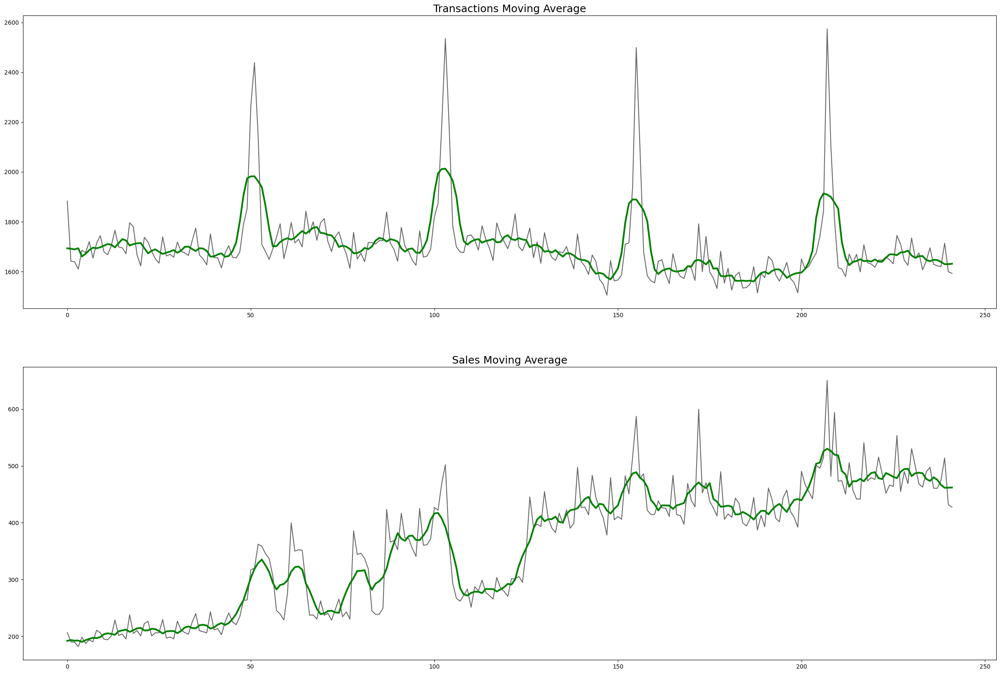

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(30,20))
plot_moving_average(transactions, 'date', 'W', 'transactions', 7, 4, axes[0], 'Transactions Moving Average')
plot_moving_average(train, 'date', 'W', 'sales', 7, 4, axes[1], 'Sales Moving Average')
plt.show()

# Seasonality

In [ ]:
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(x=X[freq],
                      y=X[y],
                      ax=ax,
                      hue=X[period],
                      palette=palette,
                      legend=False)
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(name,
                    xy=(1, y_),
                    xytext=(6, 0),
                    color=line.get_color(),
                    xycoords=ax.get_yaxis_transform(),
                    textcoords="offset points",
                    size=14,
                    va="center")
    return ax

In [ ]:
def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(ts, fs=fs, detrend=detrend, window="boxcar", scaling='spectrum')
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(["Annual (1)", "Semiannual (2)", "Quarterly (4)",
                        "Bimonthly (6)", "Monthly (12)", "Biweekly (26)",
                        "Weekly (52)", "Semiweekly (104)"], rotation=30)
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

In [ ]:
def seasonality(df, key, freq, col):
    df_grouped = grouped(df, key, freq, col)
    df_grouped['date'] = pd.to_datetime(df_grouped['date'], format = "%Y-%m-%d")
    df_grouped.index = df_grouped['date']
    df_grouped = df_grouped.drop(columns=['date'])
    df_grouped.index.freq = freq # manually set the frequency of the index

    X = df_grouped.copy()
    X.index = pd.to_datetime(X.index, format = "%Y-%m-%d")
    X.index.freq = freq
    # days within a week
    X["day"] = X.index.dayofweek   # the x-axis (freq)
    X["week"] = pd.Int64Index(X.index.isocalendar().week)  # the seasonal period (period)
    # days within a year
    X["dayofyear"] = X.index.dayofyear
    X["year"] = X.index.year
    fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(20, 30))
    seasonal_plot(X, y='mean', period="week", freq="day", ax=ax0)
    seasonal_plot(X, y='mean', period="year", freq="dayofyear", ax=ax1)
    X_new = (X['mean'].copy()).dropna()
    plot_periodogram(X_new, ax=ax2)

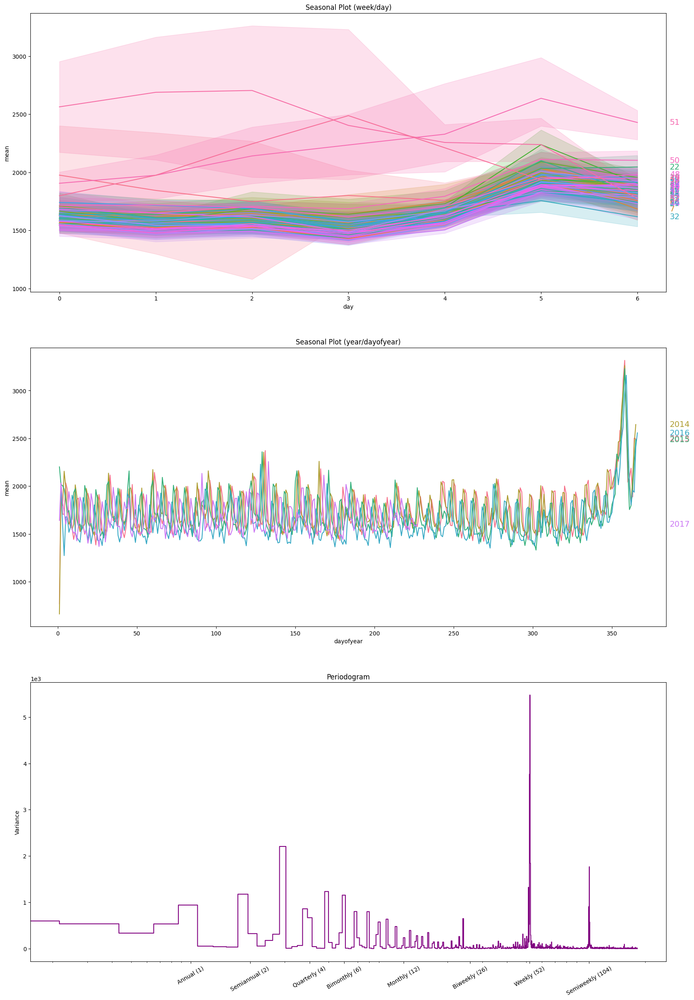

In [ ]:
seasonality(transactions, 'date', 'D', 'transactions')

In [ ]:

# import file to read
from google.colab import files
uploaded = files.upload()
# Tạo một bảng dữ liệu đơn giản

KeyboardInterrupt: ignored

In [ ]:
import numpy as np
transaction = pd.read_csv("transactions.csv")
print(transaction.head())

transaction_new = np.array_split(transaction,1000)

# Plot hinh
#plot = transaction.plot.pie ( y = transaction.transactions,figsize = (11,5))
#plot = transaction.plot.pie ( y = transaction.store_nbr,figsize = (11,5))

# Find Cycle
def find_cycles(data_series):
    values = data_series.values
    cycles = []
    seen = set()

    for index, value in enumerate(values):
        if value not in seen:
            seen.add(value)
            cycle_values = [index]
            for i in cycle(values[index + 1:]):
                if values[i] == value:
                    cycle_values.append(i)
                    cycles.append(cycle_values)
                    break

    return cycles

cycles = find_cycles(transaction_new)
print("Cycles:", cycles)

         date  store_nbr  transactions
0  2013-01-01         25           770
1  2013-01-02          1          2111
2  2013-01-02          2          2358
3  2013-01-02          3          3487
4  2013-01-02          4          1922


AttributeError: ignored

# ACF & PACF
The lag features means,shifting a time serie forward one step or more than one. So, a lag feature can use in the model to improve it. However, how many lag features should be inside the model? For understanding that, we can use ACF and PACF. The PACF is very useful to decide which features should select.

In our problem, we have multiple time series and each time series have different pattern of course. You know that those time series consists of store-product family combinations and we have 54 stores and 33 product families. We can't examine all of them one by one. For this reason, I will look at average sales for each product but it will be store independent.

In addition, the test data contains 15 days for each family. We should be careful when selecting lag features. We can't create new lag features from 1 lag to 15 lag. It must be starting 16.

https://www.kaggle.com/code/ekrembayar/store-sales-ts-forecasting-a-comprehensive-guide#8.-Did-Earhquake-affect-the-store-sales?

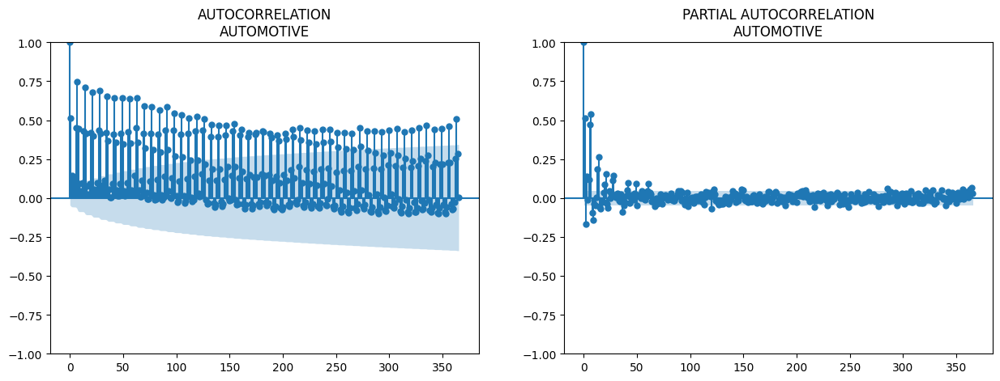

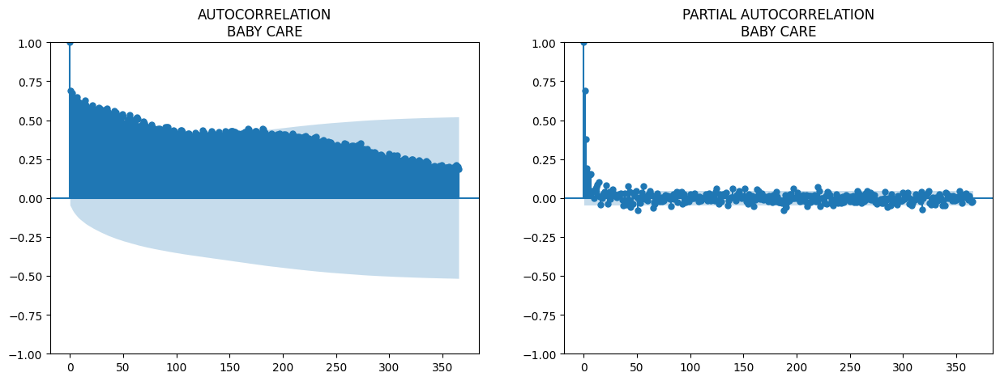

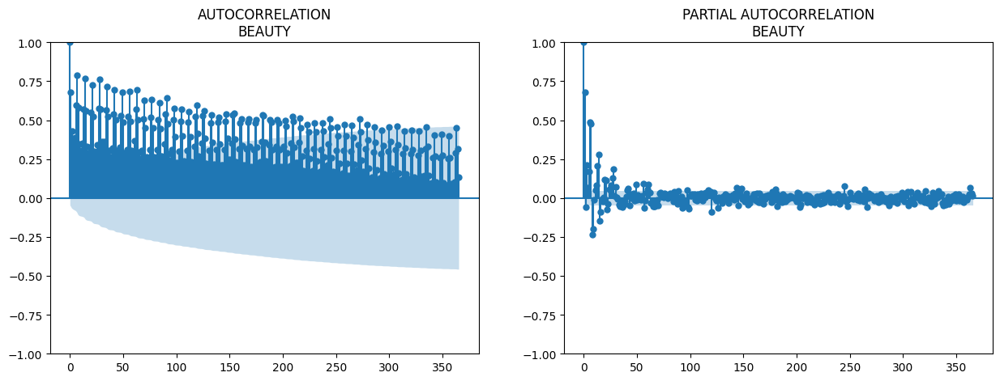

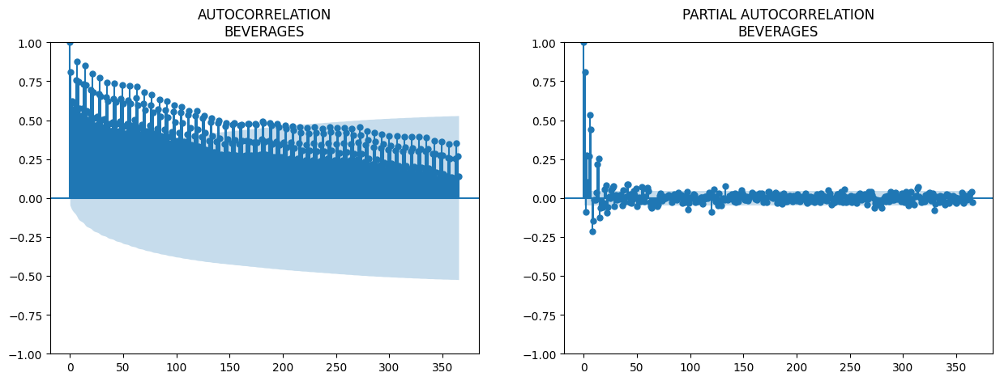

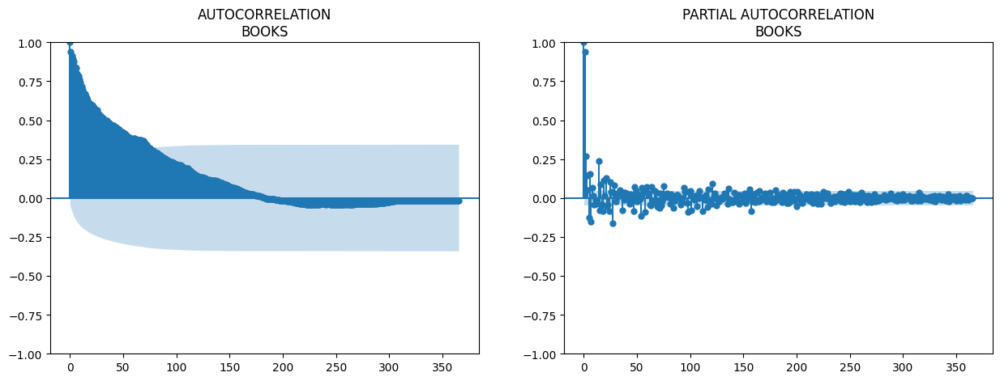

...

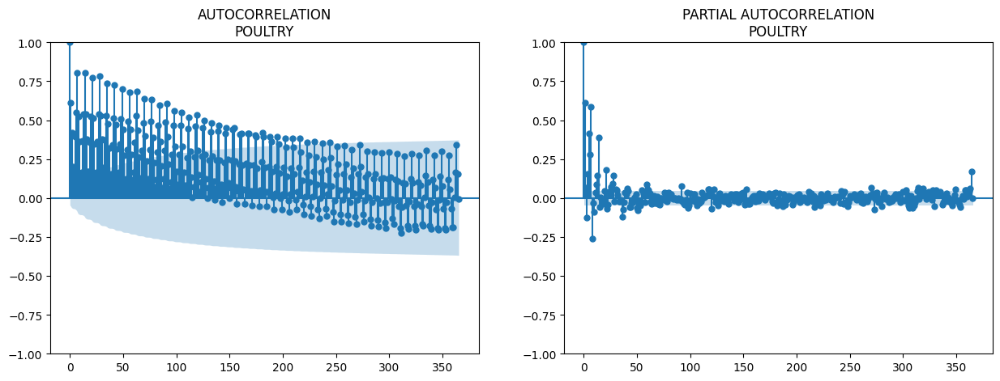

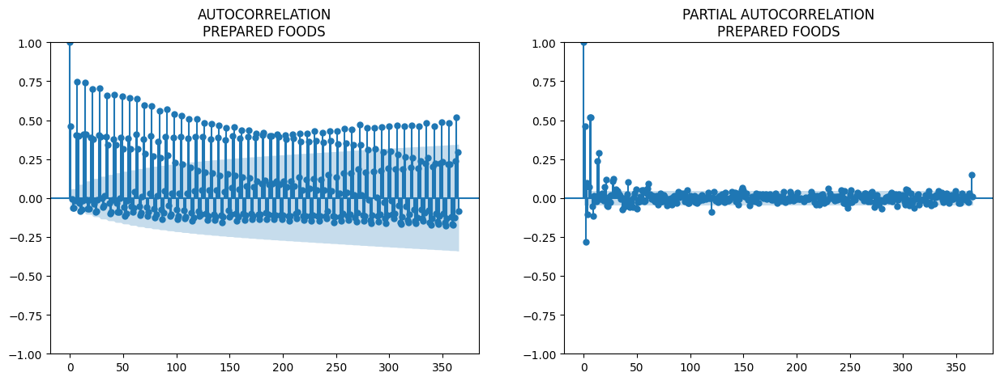

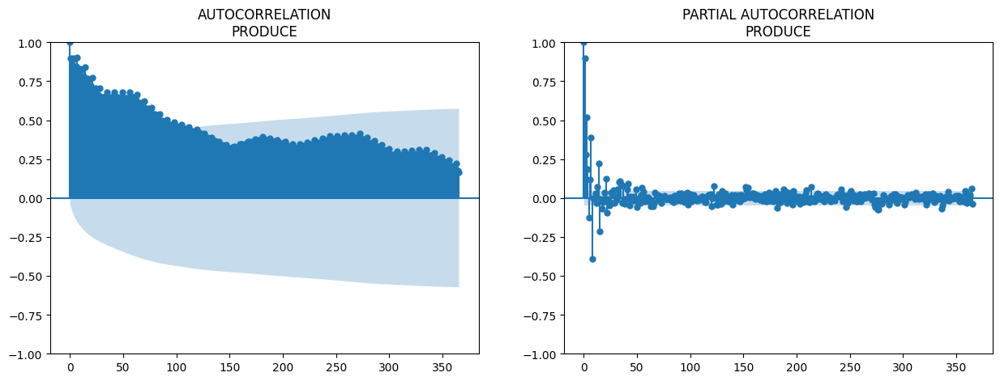

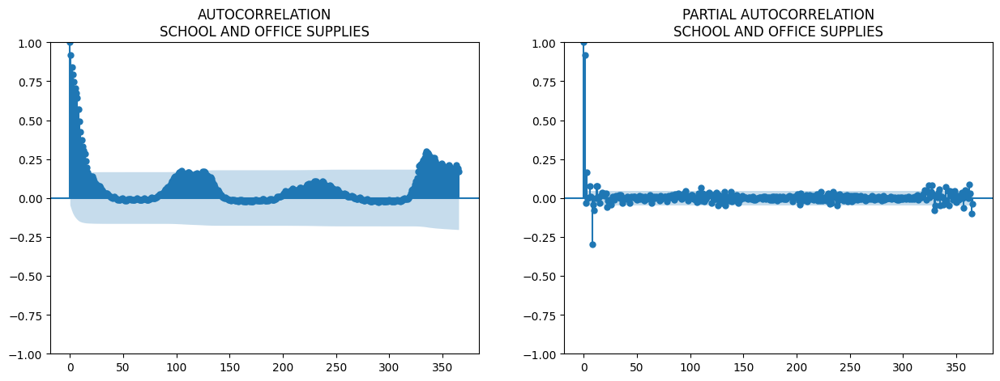

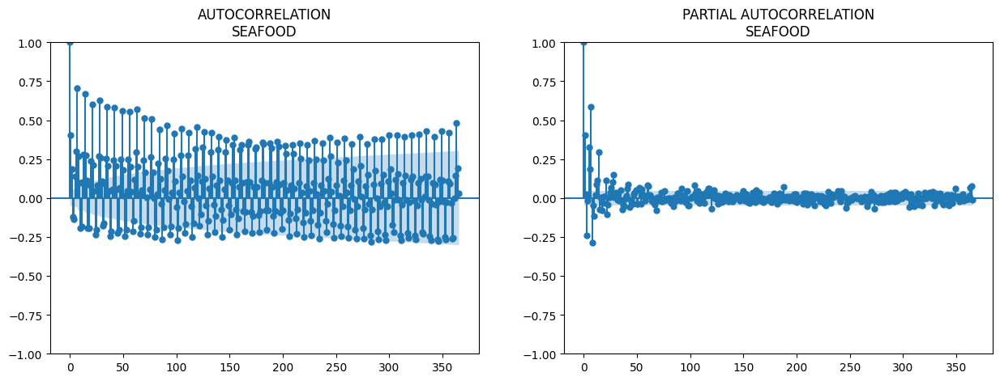

In [ ]:
#a = d[d["store_nbr"]==1].set_index("date")
# PACF - ACF
# ------------------------------------------------------
import statsmodels.api as sm
a = df_data[(df_data.sales.notnull())].groupby(["date", "family"]).sales.mean().reset_index().set_index("date")
for num, i in enumerate(a.family.unique()):
    try:
        fig, ax = plt.subplots(1,2,figsize=(15,5))
        temp = a[(a.family == i)]#& (a.sales.notnull())
        sm.graphics.tsa.plot_acf(temp.sales, lags=365, ax=ax[0], title = "AUTOCORRELATION\n" + i)
        sm.graphics.tsa.plot_pacf(temp.sales, lags=365, ax=ax[1], title = "PARTIAL AUTOCORRELATION\n" + i)
    except:
        pass

In [ ]:
    df_data['day_of_year'] = df_data.date.dt.dayofyear.astype("int16")
a = df_data[df_data.year.isin([2016,2017])].groupby(["year", "day_of_year"]).sales.mean().reset_index()
px.line(a, x = "day_of_year", y = "sales", color = "year", title = "Average sales for 2016 and 2017")

# Linear Regression

https://www.kaggle.com/code/javigallego/time-series-forecasting-tutorial#5-%7C-Feature-Transformation

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
N_SPLITS = 3

X = df_data['date']
y = df_data['sales']

folds = TimeSeriesSplit(n_splits=N_SPLITS)
f, ax = plt.subplots(nrows=N_SPLITS, ncols=2, figsize=(22, 10))

for i, (train_index, valid_index) in enumerate(folds.split(X)):
    X_train, X_valid = X[train_index], X[valid_index]
    y_train, y_valid = y[train_index], y[valid_index]

    sns.lineplot(
        x=X_train,
        y=y_train,
        ax=ax[i,0],
        color='dodgerblue',
        label='train'
    )
    sns.lineplot(
        x=X_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))],
        y=y_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))],
        ax=ax[i,1],
        color='dodgerblue',
        label='train'
    )

    for j in range(2):
        sns.lineplot(x= X_valid, y= y_valid, ax=ax[i, j], color='darkorange', label='validation')
    ax[i, 0].set_title(f"Rolling Window with Adjusting Training Size (Split {i+1})", fontsize=16)
    ax[i, 1].set_title(f"Rolling Window with Constant Training Size (Split {i+1})", fontsize=16)

plt.tight_layout()
plt.show()

KeyboardInterrupt: ignored

Error in callback <function flush_figures at 0x782c08eb5480> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
class BoostedHybrid:
    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None  # store column names from fit method

def fit(self, X_1, X_2, y):
    # Train model_1
    self.model_1.fit(X_1, y)

    # Make predictions
    y_fit = pd.DataFrame(
        self.model_1.predict(X_1),
        index=X_1.index, columns=y.columns,
    )
        # Compute residuals
    y_resid = y - y_fit
    y_resid = y_resid.stack().squeeze() # wide to long

    # Train model_2 on residuals
    self.model_2.fit(X_2, y_resid)

    # Save column names for predict method
    self.y_columns = y.columns
    # Save data for question checking
    self.y_fit = y_fit
    self.y_resid = y_resid

def predict(self, X_1, X_2):
    # Predict with model_1
    y_pred = pd.DataFrame(
        self.model_1.predict(X_1),
        index=X_1.index, columns=self.y_columns,
    )
    y_pred = y_pred.stack().squeeze()  # wide to long

    # Add model_2 predictions to model_1 predictions
    y_pred += self.model_2.predict(X_2)

    return y_pred

BoostedHybrid.fit = fit
BoostedHybrid.predict = predict


In [ ]:
def fit(self, X_1, X_2, y):
    # Train model_1
    self.model_1.fit(X_1, y)

    # Make predictions
    y_fit = pd.DataFrame(
        self.model_1.predict(X_1),
        index=X_1.index,
        columns=y.columns,
    )

    # Compute residuals
    y_resid = y - y_fit
    y_resid = y_resid.stack().squeeze() # wide to long
        # Train model_2 on residuals
    self.model_2.fit(X_2, y_resid)

    # Save column names for predict method
    self.y_columns = y.columns
    # Save data for question checking
    self.y_fit = y_fit
    self.y_resid = y_resid


# Add method to class
BoostedHybrid.fit = fit

In [ ]:
def predict(self, X_1, X_2):
    # Predict with model_1
    y_pred = pd.DataFrame(
        self.model_1.predict(X_1),
        index=X_1.index, columns=self.y_columns,
    )
    y_pred = y_pred.stack().squeeze()  # wide to long

    # Add model_2 predictions to model_1 predictions
    y_pred += self.model_2.predict(X_2)

    return y_pred.unstack()


# Add method to class
BoostedHybrid.predict = predict

In [ ]:
df_train_2017 = df_data[df_data['date'] <= datetime.datetime(2017,8,15)]
y_train = df_train_2017[['sales','date']]
y_train['date'] = y_train.date.dt.to_period('D')
y_train = y_train.set_index('date')
y_train.head(50)

,sales
date,
2013-01-01,0.0
2013-01-01,0.0
2013-01-01,0.0
2013-01-01,0.0
2013-01-01,0.0
2013-01-01,0.0
2013-01-01,0.0
2013-01-01,0.0
2013-01-01,0.0


# Trend Forecast
https://www.kaggle.com/code/maricinnamon/store-sales-time-series-forecast-visualization#3.1.-Linear-Regression

In [ ]:
def grouped(df, key, freq, col):
    """ GROUP DATA WITH CERTAIN FREQUENCY """
    df_grouped = df.groupby([pd.Grouper(key=key, freq=freq)]).agg(mean = (col, 'mean'))
    df_grouped = df_grouped.reset_index()
    return df_grouped

def add_time(df, key, freq, col):
    """ ADD COLUMN 'TIME' TO DF """
    df_grouped = grouped(df, key, freq, col)
    df_grouped['time'] = np.arange(len(df_grouped.index))
    column_time = df_grouped.pop('time')
    df_grouped.insert(1, 'time', column_time)
    return df_grouped

In [ ]:

def plot_deterministic_process(df, key, freq, col, ax1, title1, ax2, title2):
    df_grouped = grouped(df, key, freq, col)
    df_grouped['date'] = pd.to_datetime(df_grouped['date'], format = "%Y-%m-%d")
    dp = DeterministicProcess(index=df_grouped['date'], constant=True, order=1, drop=True)
    dp.index.freq = freq # manually set the frequency of the index
    # 'in_sample' creates features for the dates given in the `index` argument
    X1 = dp.in_sample()
    y1 = df_grouped["mean"]  # the target
    y1.index = X1.index
    # The intercept is the same as the `const` feature from
    # DeterministicProcess. LinearRegression behaves badly with duplicated
    # features, so we need to be sure to exclude it here.
    model = LinearRegression(fit_intercept=False)
    model.fit(X1, y1)
    y1_pred = pd.Series(model.predict(X1), index=X1.index)
    ax1 = y1.plot(linestyle='dashed', label="mean", color="0.75", ax=ax1, use_index=True)
    ax1 = y1_pred.plot(linewidth=3, label="Trend", color='b', ax=ax1, use_index=True)
    ax1.set_title(title1, fontsize=18)
    _ = ax1.legend()

    # forecast Trend for future 30 steps
    steps = 30
    X2 = dp.out_of_sample(steps=steps)
    y2_fore = pd.Series(model.predict(X2), index=X2.index)
    y2_fore.head()
    ax2 = y1.plot(linestyle='dashed', label="mean", color="0.75", ax=ax2, use_index=True)
    ax2 = y1_pred.plot(linewidth=3, label="Trend", color='b', ax=ax2, use_index=True)
    ax2 = y2_fore.plot(linewidth=3, label="Predicted Trend", color='r', ax=ax2, use_index=True)
    ax2.set_title(title2, fontsize=18)
    _ = ax2.legend()

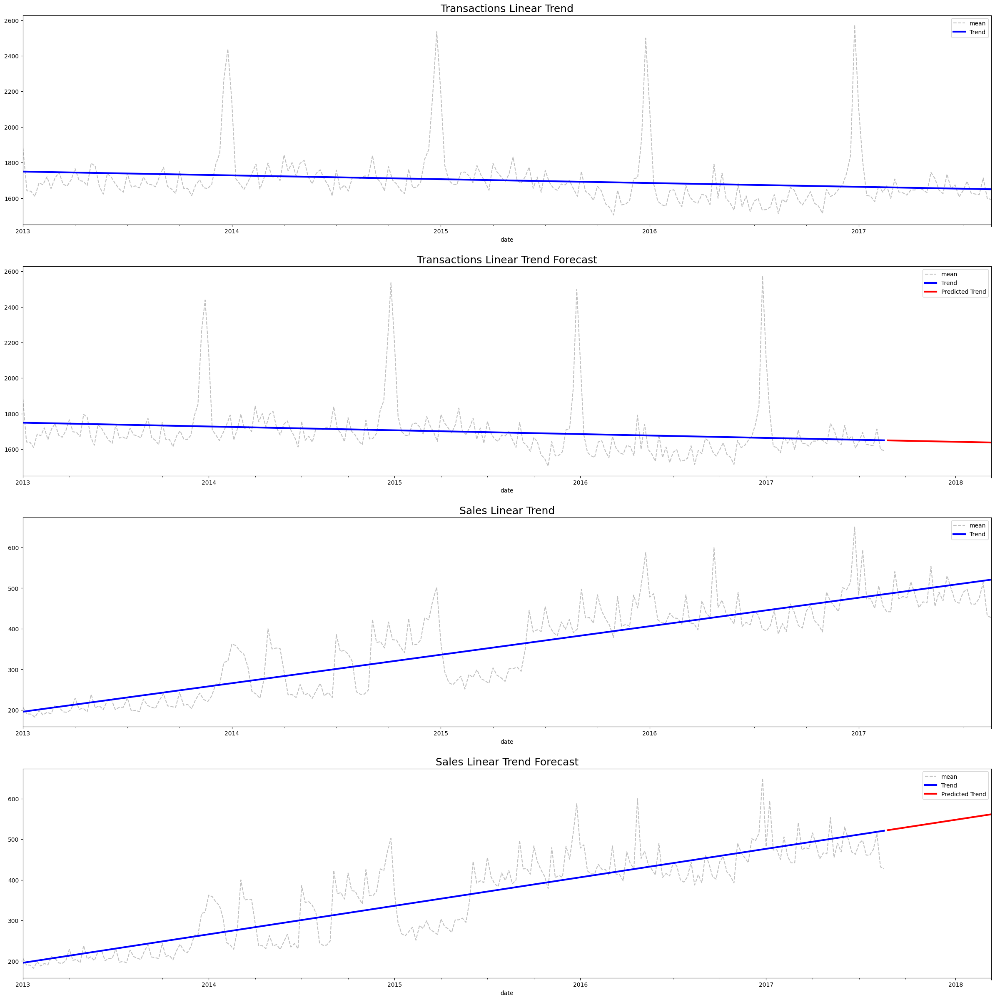

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(30,30))
plot_deterministic_process(transactions, 'date', 'W', 'transactions',
                           axes[0], "Transactions Linear Trend",
                           axes[1], "Transactions Linear Trend Forecast")
plot_deterministic_process(train, 'date', 'W', 'sales',
                           axes[2], "Sales Linear Trend",
                           axes[3], "Sales Linear Trend Forecast")
plt.show()



# Seasonality Forecast

In [ ]:
def predict_seasonality(df, key, freq, col, ax1, title1):
    fourier = CalendarFourier(freq="A", order=10)  # 10 sin/cos pairs for "A"nnual seasonality
    df_grouped = grouped(df, key, freq, col)
    df_grouped['date'] = pd.to_datetime(df_grouped['date'], format = "%Y-%m-%d")
    df_grouped['date'].freq = freq # manually set the frequency of the index
    dp = DeterministicProcess(index=df_grouped['date'],
                              constant=True,
                              order=1,
                              period=None,
                              seasonal=True,
                              additional_terms=[fourier],
                              drop=True)
    dp.index.freq = freq # manually set the frequency of the index

    # 'in_sample' creates features for the dates given in the `index` argument
    X1 = dp.in_sample()
    y1 = df_grouped["mean"]  # the target
    y1.index = X1.index

    # The intercept is the same as the `const` feature from
    # DeterministicProcess. LinearRegression behaves badly with duplicated
    # features, so we need to be sure to exclude it here.
    model = LinearRegression(fit_intercept=False)
    model.fit(X1, y1)
    y1_pred = pd.Series(model.predict(X1), index=X1.index)
    X1_fore = dp.out_of_sample(steps=90)
    y1_fore = pd.Series(model.predict(X1_fore), index=X1_fore.index)

    ax1 = y1.plot(linestyle='dashed', style='.', label="init mean values", color="0.4", ax=ax1, use_index=True)
    ax1 = y1_pred.plot(linewidth=3, label="Seasonal", color='b', ax=ax1, use_index=True)
    ax1 = y1_fore.plot(linewidth=3, label="Seasonal Forecast", color='r', ax=ax1, use_index=True)
    ax1.set_title(title1, fontsize=18)
    _ = ax1.legend()

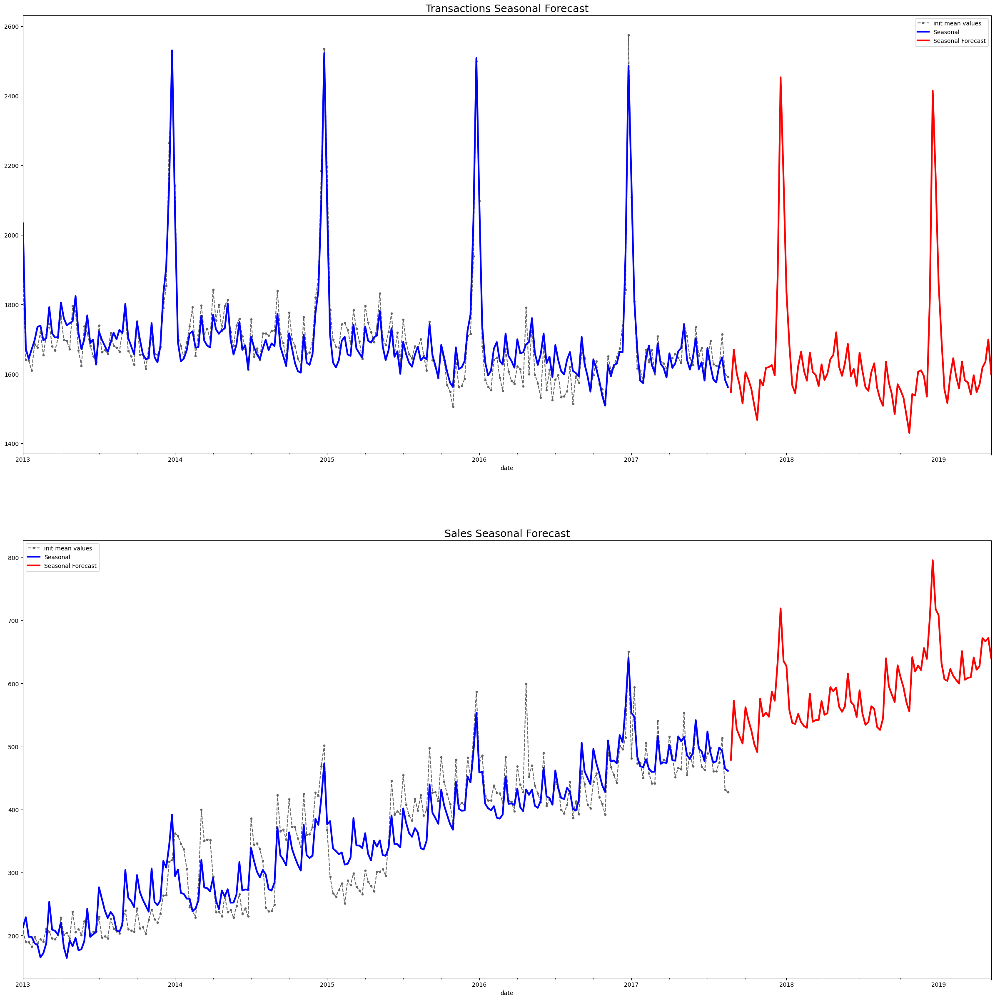

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(30,30))
predict_seasonality(transactions, 'date', 'W', 'transactions', axes[0], "Transactions Seasonal Forecast")
predict_seasonality(train, 'date', 'W', 'sales', axes[1], "Sales Seasonal Forecast")
plt.show()

https://www.kaggle.com/code/howoojang/first-kaggle-notebook-following-ts-tutorial#Seasonality

In [ ]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

fourier = CalendarFourier(freq="A", order=10)  # 10 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=avg_sales.index,
    constant=True,   # dummy feature for bias (y-intercept)
    order=1,         # trend ( order 1 means linear)
    seasonal=True,   # weekly seasonality (indicators)
    additional_terms=[fourier], # annual seasonality
    drop=True,       # drop terms to avoid collinearity
)

X = dp.in_sample() # create features for dates in tunnel.index
#X.head()
y = avg_sales["sales"]

model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=180)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot(color='0.25', style='.', title="sales - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()

# Simple Moving Average
https://www.kaggle.com/code/ekrembayar/store-sales-ts-forecasting-a-comprehensive-guide#8.-Did-Earhquake-affect-the-store-sales?

In [ ]:
a = train.sort_values(["store_nbr", "family", "date"])
for i in [20, 30, 45, 60, 90, 120, 365, 730]:
    a["SMA"+str(i)+"_sales_lag16"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(16).values
    a["SMA"+str(i)+"_sales_lag30"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(30).values
    a["SMA"+str(i)+"_sales_lag60"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(60).values
print("Correlation")
a[["sales"]+a.columns[a.columns.str.startswith("SMA")].tolist()].corr()

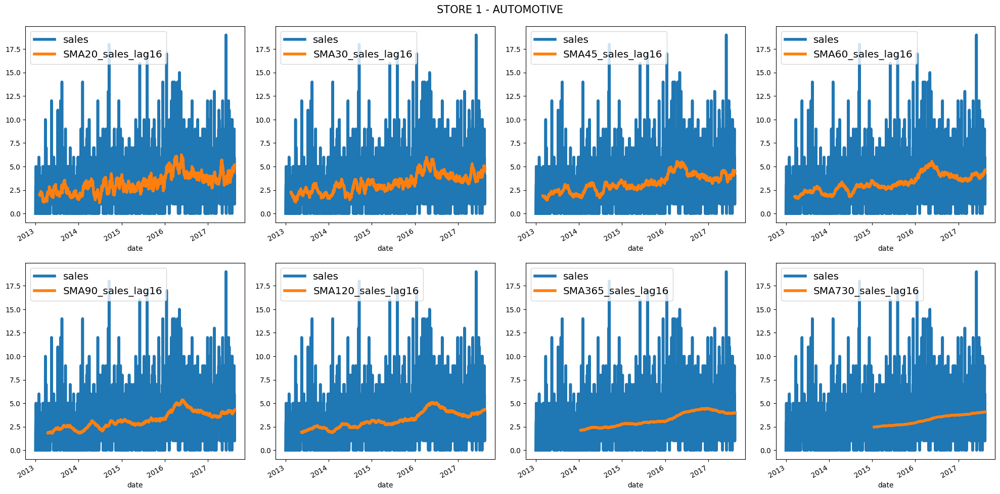

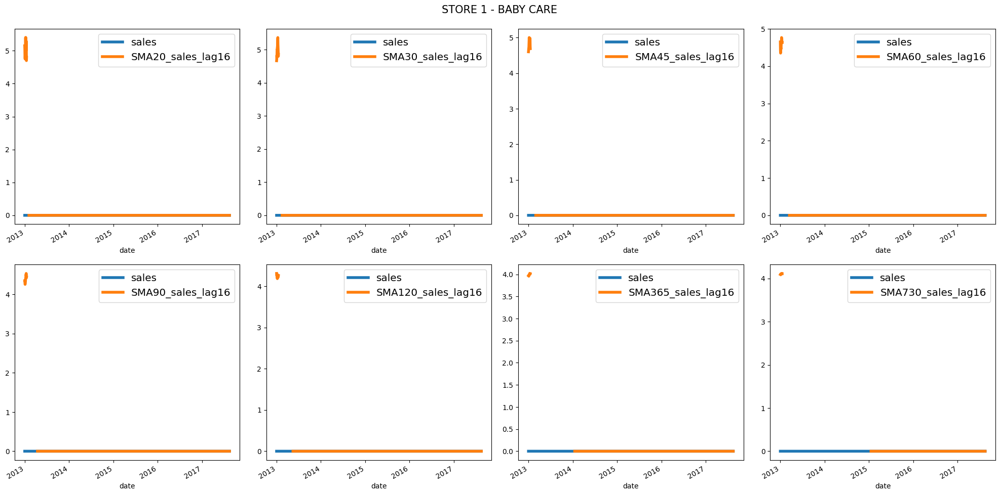

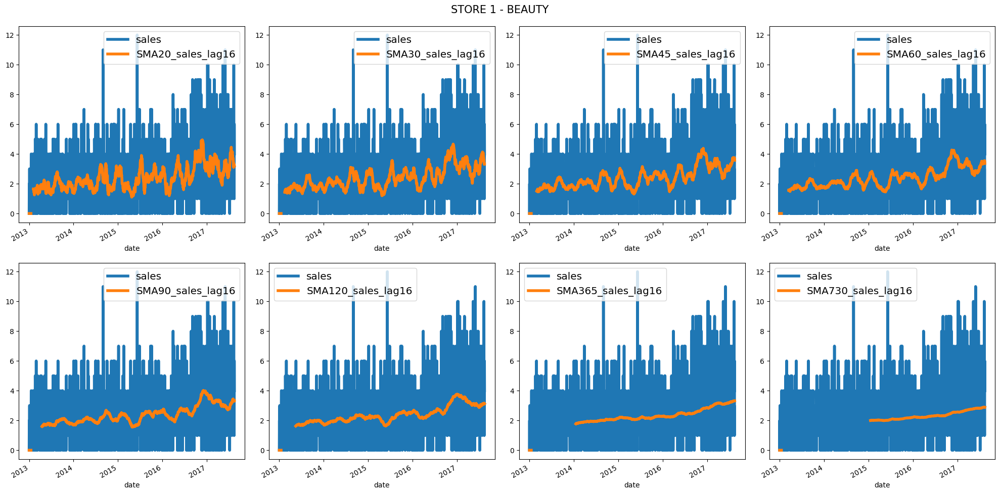

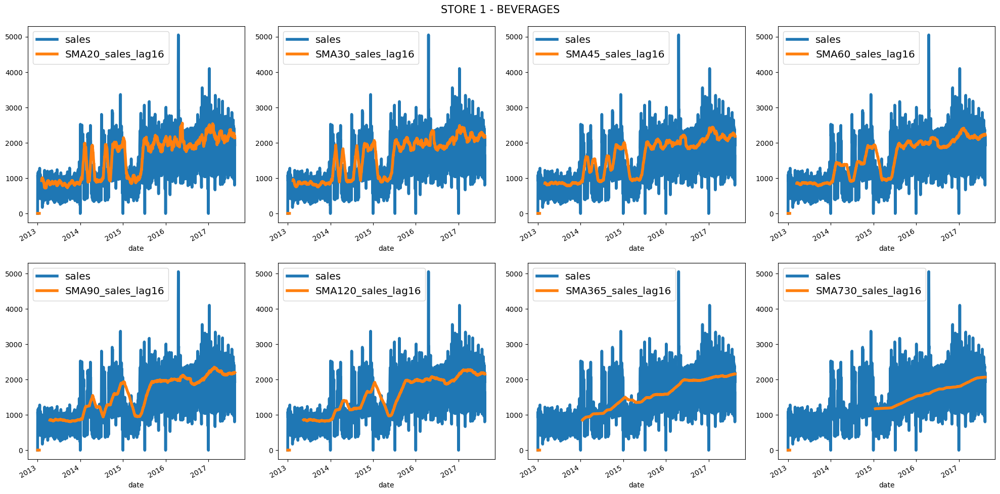

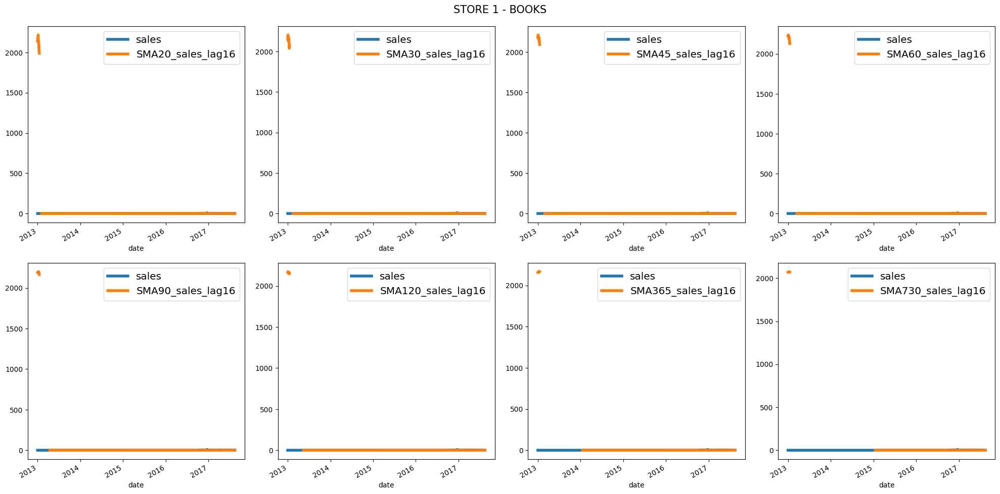

...

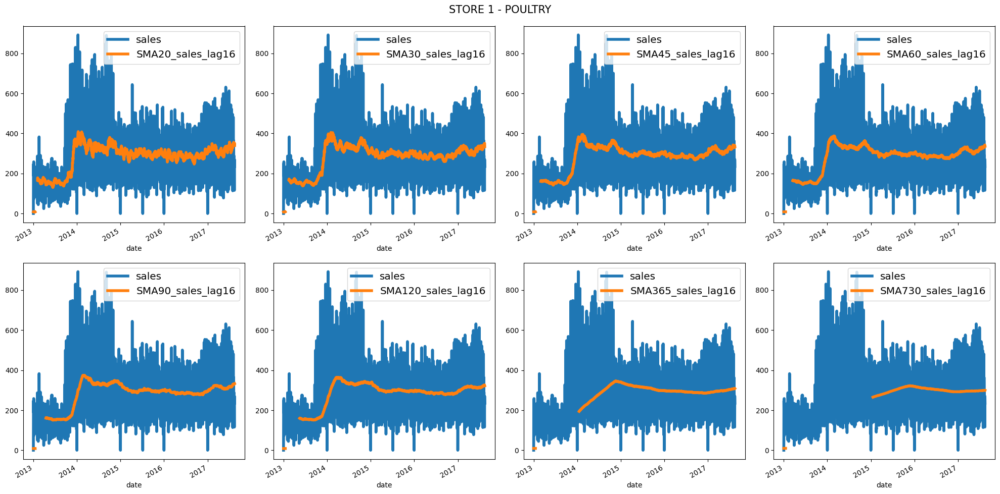

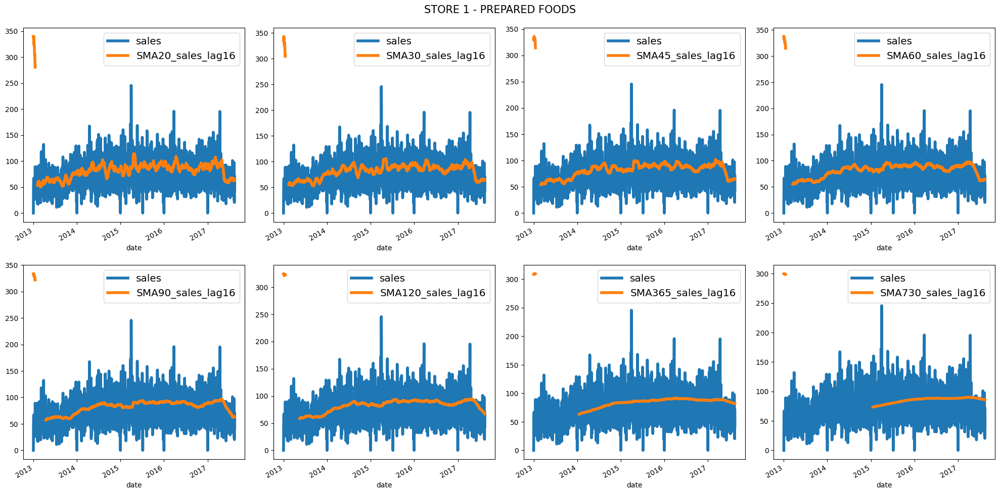

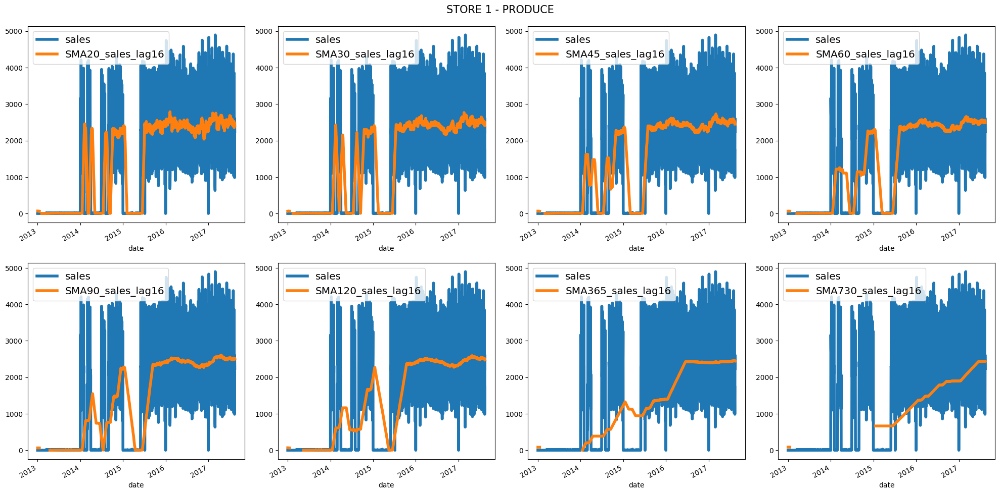

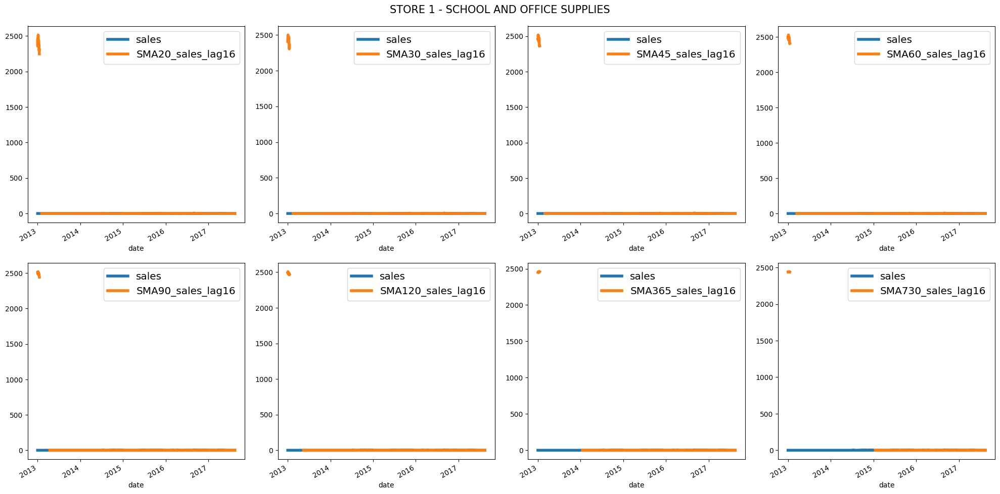

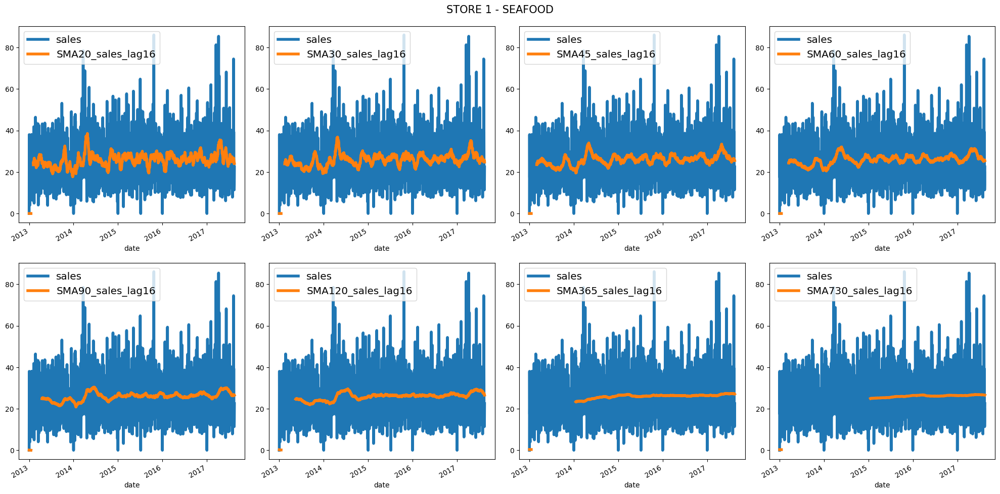

In [ ]:
b = a[(a.store_nbr == 1)].set_index("date")
for i in b.family.unique():
    fig, ax = plt.subplots(2,4,figsize=(20,10))
    b[b.family == i][["sales", "SMA20_sales_lag16"]].plot(legend = True, ax = ax[0,0], linewidth = 4)
    b[b.family == i][["sales", "SMA30_sales_lag16"]].plot(legend = True, ax = ax[0,1], linewidth = 4)
    b[b.family == i][["sales", "SMA45_sales_lag16"]].plot(legend = True, ax = ax[0,2], linewidth = 4)
    b[b.family == i][["sales", "SMA60_sales_lag16"]].plot(legend = True, ax = ax[0,3], linewidth = 4)
    b[b.family == i][["sales", "SMA90_sales_lag16"]].plot(legend = True, ax = ax[1,0], linewidth = 4)
    b[b.family == i][["sales", "SMA120_sales_lag16"]].plot(legend = True, ax = ax[1,1], linewidth = 4)
    b[b.family == i][["sales", "SMA365_sales_lag16"]].plot(legend = True, ax = ax[1,2], linewidth = 4)
    b[b.family == i][["sales", "SMA730_sales_lag16"]].plot(legend = True, ax = ax[1,3], linewidth = 4)
    plt.suptitle("STORE 1 - "+i, fontsize = 15)
    plt.tight_layout(pad = 1.5)
    for j in range(0,4):
        ax[0,j].legend(fontsize="x-large")
        ax[1,j].legend(fontsize="x-large")
    plt.show()

# Exponential Moving Average
https://www.kaggle.com/code/ekrembayar/store-sales-ts-forecasting-a-comprehensive-guide#8.-Did-Earhquake-affect-the-store-sales?

In [ ]:
def ewm_features(dataframe, alphas, lags):
    dataframe = dataframe.copy()
    for alpha in alphas:
        for lag in lags:
            dataframe['sales_ewm_alpha_' + str(alpha).replace(".", "") + "_lag_" + str(lag)] = \
                dataframe.groupby(["store_nbr", "family"])['sales']. \
                    transform(lambda x: x.shift(lag).ewm(alpha=alpha).mean())
    return dataframe

alphas = [0.95, 0.9, 0.8, 0.7, 0.5]
lags = [16, 30, 60, 90]

a = ewm_features(a, alphas, lags)

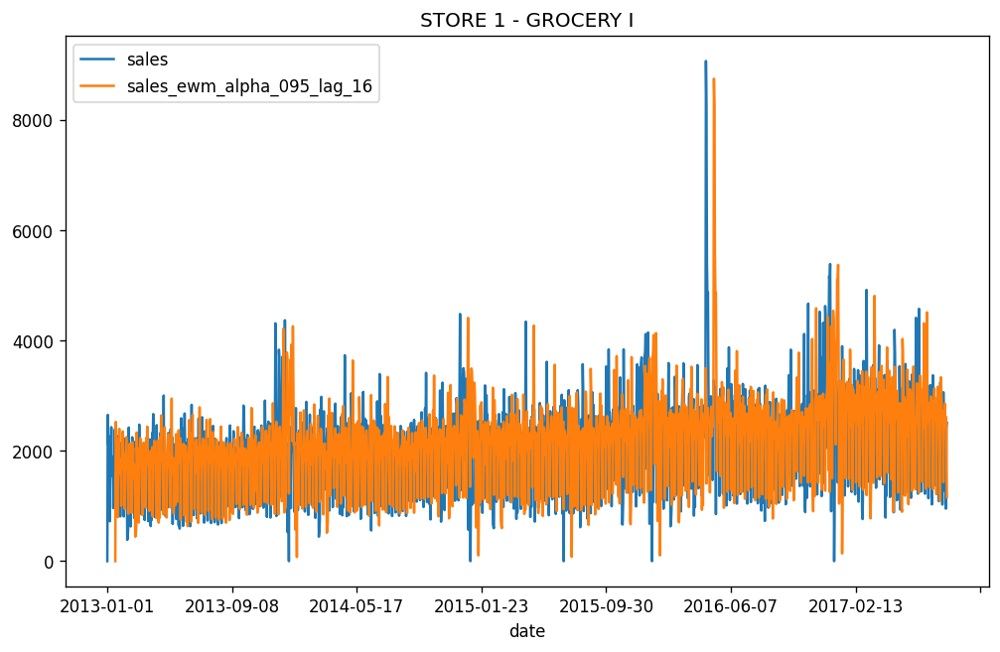

In [ ]:
a[(a.store_nbr == 1) & (a.family == "GROCERY I")].set_index("date")[["sales", "sales_ewm_alpha_095_lag_16"]].plot(title = "STORE 1 - GROCERY I");

# Nội dung tham khảo
https://www.kaggle.com/code/kashishrastogi/store-sales-analysis-time-serie

In [ ]:
plt.figure(figsize=(16,16))

plt.subplot(2,2,1) ## Avg. Sales by State Chart
state_grouped=stores.groupby('state')['sales'].mean().sort_values(ascending=False)
sns.barplot(x=state_grouped.index, y=state_grouped.values,
           ci=None, order=list(state_grouped.index))
plt.xlabel('')
plt.xticks(rotation=45)
plt.ylabel('Avg. Sales')
plt.title('Avg. Sales by State')

plt.subplot(2,2,2)
type_grouped=stores.groupby('type')['sales'].mean().sort_values(ascending=False)
plt.pie(type_grouped, labels=type_grouped.index, autopct="%1.1f%%")
plt.axis('equal')
plt.title('Avg. Sales by Store Type')

plt.subplot(2,2,3)
cluster_grouped=stores.groupby('cluster')['sales'].mean().sort_values(ascending=False)
plt.pie(cluster_grouped, labels=cluster_grouped.index, autopct="%1.1f%%")
plt.axis('equal')
plt.title('Avg. Sales by Store Cluster')

plt.subplot(2,2,4)
city_grouped=stores.groupby('city')['sales'].mean().sort_values(ascending=False)
sns.barplot(x=city_grouped.index, y=city_grouped.values,
           ci=None, order=list(city_grouped.index))
plt.xlabel('')
plt.xticks(rotation=45)
plt.ylabel('Avg. Sales')
plt.title('Avg. Sales by City')

plt.show()

In [ ]:
fig=go.Figure()
fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3],
    y=[1.6, 1.6, 1.6, 1.6],
    mode="text",
    text=["<span style='font-size:33px'><b>54</b></span>",
          "<span style='font-size:33px'><b>33</b></span>",
          "<span style='font-size:33px'><b>16</b></span>",
          "<span style='font-size:33px'><b>56</b></span>"],
    textposition="bottom center"
))
fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3],
    y=[1.1, 1.1, 1.1, 1.1],
    mode="text",
    text=["Stores", "Products", "States", "Months"],
    textposition="bottom center"
))
fig.add_hline(y=2.2, line_width=5, line_color='gray')
fig.add_hline(y=0.3, line_width=3, line_color='gray')
fig.update_yaxes(visible=False)
fig.update_xaxes(visible=False)
fig.update_layout(showlegend=False, height=300, width=700,
                  title='Store Sales Summary', title_x=0.5, title_y=0.9,
                  xaxis_range=[-0.5,3.6], yaxis_range=[-0.2,2.2],
                  plot_bgcolor='#fafafa', paper_bgcolor='#fafafa',
                  font=dict(size=23, color='#323232'),
                  title_font=dict(size=35, color='#222'),
                  margin=dict(t=90,l=70,b=0,r=70),

In [ ]:
# data
df_m_sa = df_data.groupby('month').agg({"sales" : "mean"}).reset_index()
df_m_sa['sales'] = round(df_m_sa['sales'],2)
df_m_sa['month_text'] = df_m_sa['month'].apply(lambda x: calendar.month_abbr[x])
df_m_sa['text'] = df_m_sa['month_text'] + ' - ' + df_m_sa['sales'].astype(str)

df_w_sa = df_data.groupby('week').agg({"sales" : "mean"}).reset_index()
df_q_sa = df_data.groupby('quarter').agg({"sales" : "mean"}).reset_index()
# chart color
df_m_sa['color'] = '#496595'
df_m_sa['color'][:-1] = '#c6ccd8'
df_w_sa['color'] = '#c6ccd8'

# chart
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.08,
                    row_heights=[0.7, 0.3],
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3],
                    subplot_titles=("Month wise Avg Sales Analysis", "Quarter wise Avg Sales Analysis",
                                    "Week wise Avg Sales Analysis"))

fig.add_trace(go.Bar(x=df_m_sa['sales'], y=df_m_sa['month'], marker=dict(color= df_m_sa['color']),
                     text=df_m_sa['text'],textposition='auto',
                     name='Month', orientation='h'),
                     row=1, col=1)
fig.add_trace(go.Pie(values=df_q_sa['sales'], labels=df_q_sa['quarter'], name='Quarter',
                     marker=dict(colors=['#334668','#496595','#6D83AA','#91A2BF','#C8D0DF']), hole=0.7,
                     hoverinfo='label+percent+value', textinfo='label+percent'),
                     row=1, col=2)
fig.add_trace(go.Scatter(x=df_w_sa['week'], y=df_w_sa['sales'], mode='lines+markers', fill='tozeroy', fillcolor='#c6ccd8',
                     marker=dict(color= '#496595'), name='Week'),
                     row=2, col=1)

# styling
fig.update_yaxes(visible=False, row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode = 'array', tickvals=df_w_sa.week, ticktext=[i for i in range(1,53)],
                 row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=750, bargap=0.15,
                  margin=dict(b=0,r=20,l=20),
                  title_text="Average Sales Analysis",
                  template="plotly_white",
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.show()

In [ ]:
# data
df_dw_sa = df_data.groupby('day_of_week').agg({"sales" : "mean"}).reset_index()
df_dw_sa.sales = round(df_dw_sa.sales, 2)

# chart
fig = px.bar(df_dw_sa, y='day_of_week', x='sales', title='Avg Sales vs Day of Week',
             color_discrete_sequence=['#c6ccd8'], text='sales',
             category_orders=dict(day_of_week=["Monday","Tuesday","Wednesday","Thursday", "Friday","Saturday","Sunday"]))
fig.update_yaxes(showgrid=False, ticksuffix=' ', showline=False)
fig.update_xaxes(visible=False)
fig.update_layout(margin=dict(t=60, b=0, l=0, r=0), height=350,
                  hovermode="y unified",
                  yaxis_title=" ", template='plotly_white',
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#c6ccd8", font_size=13, font_family="Lato, sans-serif"))

In [ ]:
#*****************************************solution 1 **************************************************************
# https://www.kaggle.com/code/rinichristy/time-series-forecast-store-sales
X = Total_sales.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
from statsmodels.tsa.arima.model import ARIMA
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

In [ ]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 18.9 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima_model import ARIMA

# Data Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
pio.templates.default = "none"


In [ ]:
train = pd.read_csv("train.csv")

In [ ]:
train['date'] = pd.to_datetime(train['date'], format = "%Y-%m-%d")

In [ ]:
def grouped(df, key, freq, col):
    """ GROUP DATA WITH CERTAIN FREQUENCY """
    df_grouped = df.groupby([pd.Grouper(key=key, freq=freq)]).agg(mean = (col, 'mean'))
    df_grouped = df_grouped.reset_index()
    return df_grouped

df_grouped_sales_m = grouped(train, 'date', 'M', 'sales')
df_grouped_sales_w = grouped(train, 'date', 'W', 'sales')
df_grouped_sales_w.head()

,date,mean
0,2013-01-06,206.843478
1,2013-01-13,190.285220
2,2013-01-20,189.835452
3,2013-01-27,182.152050
4,2013-02-03,198.564267


In [ ]:
print(df_grouped_sales_w.shape)

# first 36 rows as training
training = df_grouped_sales_w[0:156]

# remaining rows for testing
testing = df_grouped_sales_w[156:]

print(training.shape, testing.shape)

(242, 2)
(156, 2) (86, 2)


In [ ]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.3 MB/s eta 0:00:00


In [ ]:
#soluon 2
# https://www.kaggle.com/code/shilongzhuang/advanced-time-series-forecasting-with-python#1.-ARIMA-Model
from pmdarima import auto_arima
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#*****************************************************solution 2 ********************************************************************************
# Run combinations of ARIMA(p,d,q)
model_fit = auto_arima(training['mean'],
                       m=52,
                       d=0,
                       D=0,
                       max_order=None,
                       max_p=30,
                       max_q=7,
                       max_d=7,
                       max_P=4,
                       max_Q=4,
                       max_D=2,
                       maxiter = 50,
                       alpha = 0.05,
                       n_jobs = -1,
                       seasonal=True,
                       trace=True,
                       error_action='ignore',
                       suppress_warnings=True,
                       stepwise=True
                      )

model_fit.summary()


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[52] intercept   : AIC=inf, Time=12.72 sec
 ARIMA(0,0,0)(0,0,0)[52] intercept   : AIC=1854.305, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[52] intercept   : AIC=1577.148, Time=3.77 sec
 ARIMA(0,0,1)(0,0,1)[52] intercept   : AIC=inf, Time=4.29 sec
 ARIMA(0,0,0)(0,0,0)[52]             : AIC=2241.066, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[52] intercept   : AIC=1602.051, Time=0.13 sec
 ARIMA(1,0,0)(2,0,0)[52] intercept   : AIC=inf, Time=23.69 sec
 ARIMA(1,0,0)(1,0,1)[52] intercept   : AIC=1578.210, Time=7.57 sec
 ARIMA(1,0,0)(0,0,1)[52] intercept   : AIC=1579.720, Time=2.43 sec
 ARIMA(1,0,0)(2,0,1)[52] intercept   : AIC=inf, Time=30.03 sec
 ARIMA(0,0,0)(1,0,0)[52] intercept   : AIC=1847.699, Time=3.78 sec
 ARIMA(2,0,0)(1,0,0)[52] intercept   : AIC=1578.688, Time=4.33 sec
 ARIMA(1,0,1)(1,0,0)[52] intercept   : AIC=1578.728, Time=4.79 sec
 ARIMA(0,0,1)(1,0,0)[52] intercept   : AIC=1724.147, Time=6.58 sec
 ARIMA(2,0,1)(1,0,0)[52] intercept  

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  156
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 52)   Log Likelihood                -784.574
Date:                            Thu, 04 Jan 2024   AIC                           1577.148
Time:                                    16:08:50   BIC                           1589.348
Sample:                                         0   HQIC                          1582.103
                                            - 156                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     12.8597      8.997      1.429      0.153      -4.774      30.493
ar.L1          0.9253      0.043     21.519      0.000       0.841       1.010
ar.S.L52       0.4384      0.092      4.766      0.000       0.258       0.619
sigma2      1257.7645     91.993     13.672      0.000    1077.461    1438.068
===================================================================================
Ljung-Box (L1) (Q):                   0.39   Jarque-Bera (JB):               220.58
Prob(Q):                              0.53   Prob(JB):                         0.00
Heteroskedasticity (H):               4.31   Skew:                             1.06
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
# solution2
model_fit


<Axes: >

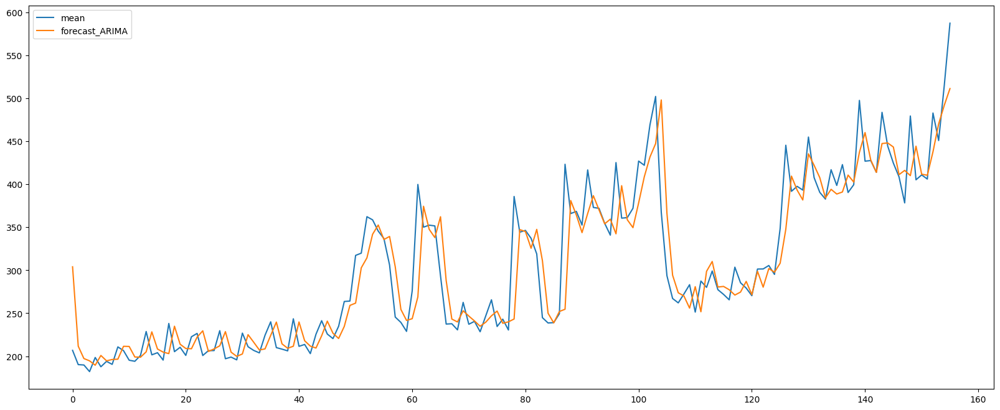

In [ ]:
#solution 2
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Fit the ARIMA model
model_ARIMA = ARIMA(training['mean'],
              order=(4,0,0),
              seasonal_order=(4, 0, 0, 52)
            )

# Fit the model
model_ARIMA = model_ARIMA.fit()

train_forecast = trainingU J .copy()
test_forecast = testing.copy()

train_forecast['forecast_ARIMA'] = model_ARIMA.predict()
train_forecast[['mean','forecast_ARIMA']].plot(figsize=(20,8))

<Axes: >

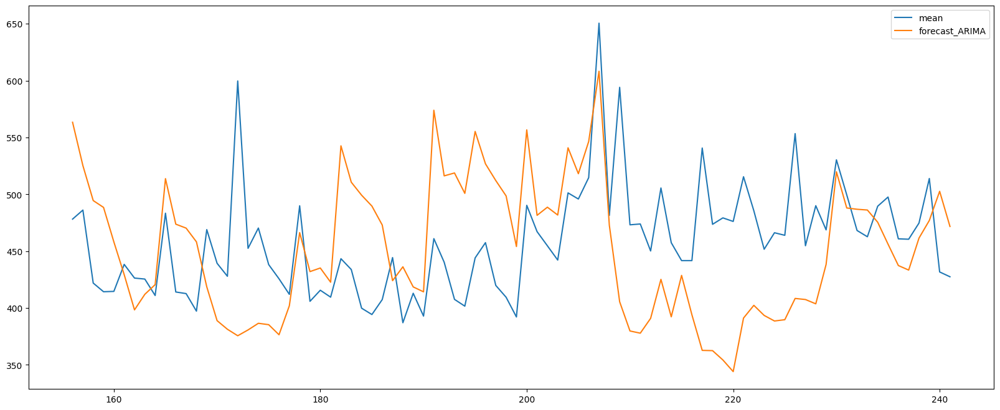

In [ ]:
# Forecast and compare against test data

# start date
start = len(training)

# End date
end = len(training)+len(testing)-1

test_forecast['forecast_ARIMA'] = model_ARIMA.predict(start=start, end=end, )
test_forecast[['mean','forecast_ARIMA']].plot(figsize=(20,8))

In [ ]:
#solution 2
from sklearn.metrics import mean_absolute_error, mean_squared_error

print("RMSE of Auto ARIMA:", np.sqrt(mean_squared_error(test_forecast['mean'], test_forecast['forecast_ARIMA'])))
print("MAE of Auto ARIMA:", mean_absolute_error(test_forecast['mean'], test_forecast['forecast_ARIMA']))

RMSE of Auto ARIMA: 74.11849912967759
MAE of Auto ARIMA: 60.58182312088649


In [ ]:
# *********************************************************solution 3 *******************************************************************
# https://www.kaggle.com/code/rodmnzs/store-sales-time-series-forecasting#ARMA
